In [1]:
import torchvision
from torch import nn,utils
import torch.optim as optim
from dataset_builder import *
from model_train_val import *

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
!which python

/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/bin/python


In [4]:
'''transform = transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])'''

transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])


'''(black,black_dataSets,black_dataLoader) = generate_dataset('./data/black',transform,0.3)
(blue,blue_dataSets,blue_dataLoader) = generate_dataset('./data/blue',transform,0.3)
(green,green_dataSets,green_dataLoader) = generate_dataset('./data/green',transform,0.3)
(yellow,yellow_dataSets,yellow_dataLoader) = generate_dataset('./data/yellow',transform,0.3)
(other,other_dataSets,other_dataLoader) = generate_dataset('./data/other',transform,0.3)

black_class_names = black.classes
black_dataset_sizes = len(black)'''

(all,all_dataSets,all_dataLoader) = generate_dataset('./data_dim',transform,0.3)

class_names = all.classes
all_dataset_sizes = len(all)

In [5]:
inputs, classes = next(iter(all_dataLoader['train']))
out = torchvision.utils.make_grid(inputs)

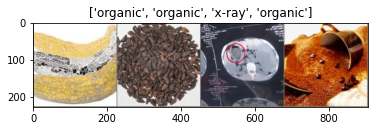

In [6]:
imshow(out,class_indices=classes,class_names=class_names)

In [7]:
#SQUEEZE-NET
#Load your model and train it
model_squeezenet = torchvision.models.squeezenet1_0(pretrained=True)

for param in model_squeezenet.parameters():
     param.requires_grad = False

model_squeezenet.classifier[1] = nn.Conv2d(512, len(all.classes), kernel_size=(1,1), stride=(1,1))

model_squeezenet = model_squeezenet.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_vgg = optim.SGD(model_squeezenet.classifier.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_vgg , step_size=7, gamma=0.1)

checkpoint_path = "./checkpoints/squeezeNet"

model_squeezenet_all = train_model(all_dataSets, all_dataLoader, model_squeezenet, criterion, optimizer_vgg,
                         exp_lr_scheduler, checkpoint_path, num_epochs=25, device=device)

Epoch 0/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 1.2137 Acc: 0.6771


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.2130 Acc: 0.6950

Epoch 1/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.9528 Acc: 0.7334


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0722 Acc: 0.7291

Epoch 2/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.8796 Acc: 0.7548


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0477 Acc: 0.7336

Epoch 3/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.8445 Acc: 0.7623


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0320 Acc: 0.7353

Epoch 4/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.8237 Acc: 0.7661


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0575 Acc: 0.7309

Epoch 5/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.8035 Acc: 0.7711


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0279 Acc: 0.7394

Epoch 6/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.7880 Acc: 0.7764


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 1.0278 Acc: 0.7428

Epoch 7/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6617 Acc: 0.8065


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.9405 Acc: 0.7578

Epoch 8/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6370 Acc: 0.8140


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.9125 Acc: 0.7603

Epoch 9/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6331 Acc: 0.8149


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.9038 Acc: 0.7593

Epoch 10/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6229 Acc: 0.8161


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8966 Acc: 0.7605

Epoch 11/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6138 Acc: 0.8168


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8875 Acc: 0.7630

Epoch 12/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6145 Acc: 0.8189


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8763 Acc: 0.7651

Epoch 13/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.6142 Acc: 0.8172


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8701 Acc: 0.7658

Epoch 14/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5998 Acc: 0.8211


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8611 Acc: 0.7668

Epoch 15/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5930 Acc: 0.8232


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8582 Acc: 0.7692

Epoch 16/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5938 Acc: 0.8252


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8588 Acc: 0.7675

Epoch 17/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5950 Acc: 0.8238


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8579 Acc: 0.7669

Epoch 18/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5954 Acc: 0.8236


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8542 Acc: 0.7682

Epoch 19/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5907 Acc: 0.8234


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8557 Acc: 0.7673

Epoch 20/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5942 Acc: 0.8249


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8560 Acc: 0.7667

Epoch 21/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5919 Acc: 0.8234


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8561 Acc: 0.7667

Epoch 22/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5927 Acc: 0.8239


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8561 Acc: 0.7669

Epoch 23/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5911 Acc: 0.8237


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8557 Acc: 0.7671

Epoch 24/24
----------


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


train Loss: 0.5934 Acc: 0.8234


/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/vader/sfu/spring22/cmpt733/Project/image-classfier-waste-sorting/733Project/lib/python3.8/site-packages/PIL/Image.py:945: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


val Loss: 0.8551 Acc: 0.7670

Training complete in 106m 57s
Best val Acc: 0.769173


In [10]:
#torch.save(model_squeezenet,'./models/squeezeNet.pt')
squeezeNet_loaded = torch.load('./models/squeezeNet.pt')
squeezeNet_loaded.eval()

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(96, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): Fire(
   

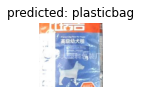

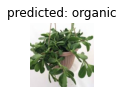

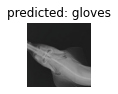

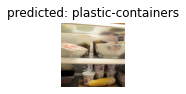

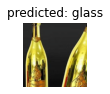

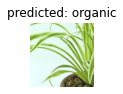

In [11]:
visualize_model(all.classes,all_dataLoader,squeezeNet_loaded,device=device)

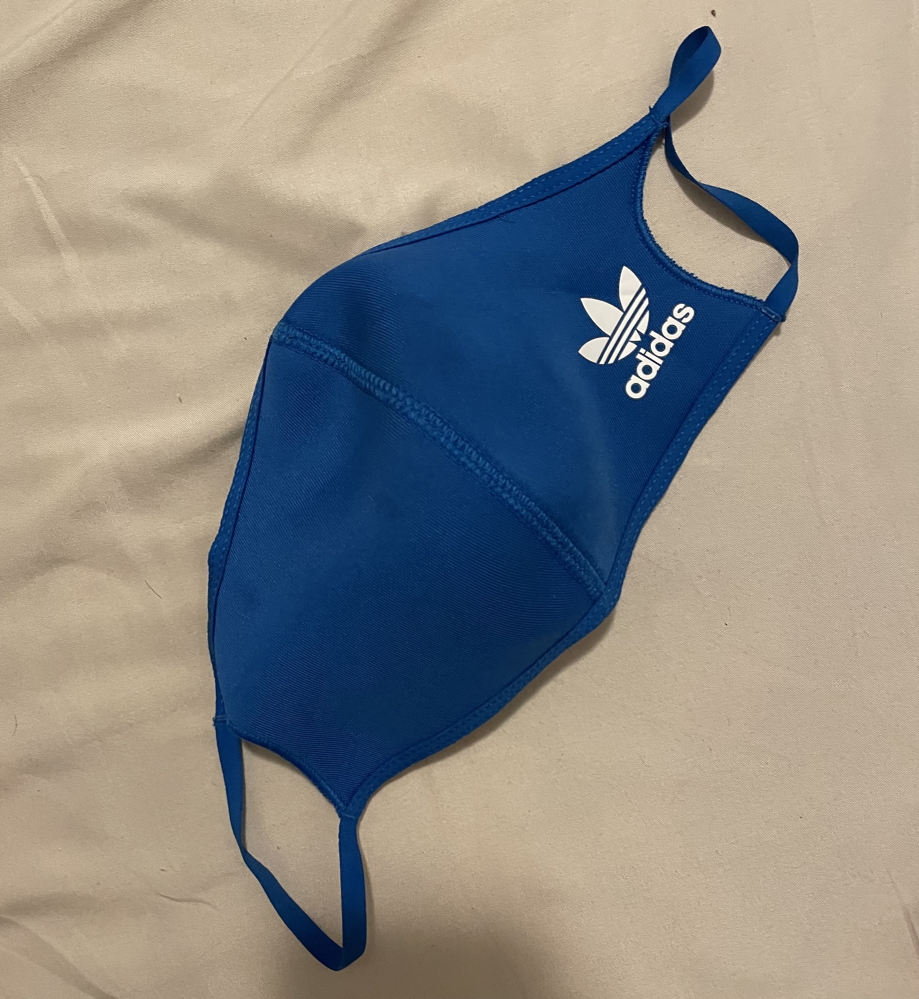

Predicted Index : 10, Class : gloves, Confidence Level : 7.6%


In [12]:
min_img_size = 224

transform_pipeline = transforms.Compose([transforms.Resize(min_img_size),
                                         transforms.ToTensor(),
                                         transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                              std=[0.229, 0.224, 0.225])])

pred_image(squeezeNet_loaded,"adidas_mask.jpg",class_names,transform_pipeline, show_image = True,device = device)